# Settings

In [1]:
# Load Reticulate function
Sys.setenv(RETICULATE_PYTHON="/home/luca/anaconda3/envs/reticulate/bin/python")
library(reticulate)
reticulate::use_python("/home/luca/anaconda3/envs/reticulate/bin/python")
reticulate::use_condaenv("/home/luca/anaconda3/envs/reticulate")
reticulate::py_module_available(module='anndata') #needs to be TRUE
reticulate::import('anndata') #good to make sure this doesn't error
reticulate::py_module_available(module='leidenalg') #needs to be TRUE
reticulate::import('leidenalg') #good to make sure this doesn't error

[1] TRUE

Module(anndata)

[1] TRUE

Module(leidenalg)

In [2]:
## Patch for annotations in R4.1
# BiocManager::install("Bioconductor/GenomeInfoDb",lib = "/home/luca/R/x86_64-pc-linux-gnu-library/4.1",force = TRUE)
# library(GenomeInfoDb,lib.loc="/home/luca/R/x86_64-pc-linux-gnu-library/4.1")

In [3]:
# Load packages
pacman::p_load(dplyr, stringr, data.table, tidyr, data.table, Matrix,
               hdf5r, Seurat, Signac,harmony, knitr, SoupX,
               EnsDb.Hsapiens.v86, 
               logr, parallel, 
               ggplot2, ggpubr, ggrepel, ggbreak, gridExtra, grid, ggh4x)

In [4]:
# Load table
annotations = readRDS("/nfs/lab/Luca/Assets/references/Cellranger/hg38.annotations.rds")
seqlevelsStyle(annotations) <- 'UCSC'
genome(annotations) <- 'hg38'

# Seq info downloaded from: https://github.com/broadinstitute/ichorCNA/issues/84
seq.info = readRDS("/nfs/lab/Luca/Assets/references/Cellranger/seqinfo_hg38_ucsc.rds")

In [5]:
# Set options
options(stringsAsFactors = FALSE)
warnLevel <- getOption('warn')
options(warn = -1)
opts_chunk$set(tidy=TRUE)

# set Future
plan("multicore", workers = 4)
# set RAM treshold
## 1000 = 1gb
RAM.tresh = 10000 * 1024^2
options(future.globals.maxSize = RAM.tresh)

In [6]:
# Set directories
base.dir = "/nfs/lab/projects/mega_heart/CAREHF/multiome/"
assets.dir = "/nfs/lab/projects/mega_heart/CAREHF/multiome/Assets/"

cellranger.links.dir = "/nfs/lab/projects/mega_heart/CAREHF/multiome/cellranger.symlinks/"

step1.dir = "/nfs/lab/projects/mega_heart/CAREHF/multiome/1_preprocessing/"

In [7]:
# Load markers list
cell.markers = read.table(paste("/nfs/lab/projects/mega_heart/Assets/", "Cell.markers_3.txt", sep = ""), sep = "\t", header = TRUE)
# Make it long, remove useless column and void markers
cell.markers <- cell.markers %>% gather(Key, marker, c(3:ncol(cell.markers)))
cell.markers = cell.markers[,-3]
cell.markers = cell.markers[cell.markers$marker != "", ]
# Factorize columns
cell.markers$Compartment = factor(cell.markers$Compartment, 
                        levels = c("Muscular", "Vascular", "Neuro", "Stromal", "Immune"))
cell.markers$CellType = factor(cell.markers$CellType,
                        levels = c("CM", "Atrial-CM", "Ventricular-CM",
"SM", "Endothelial", "Endocardial", "Epicardial", "Lymph-Endo", "Pericyte",
"Neuronal", "Fibroblast", "Adipocyte", 
"Macrophage", "T-NK", "NK", "B", "Mast"))

cell.compartment = cell.markers[,-3]

In [8]:
levels(cell.markers$Compartment)

[1] "Muscular" "Vascular" "Neuro"    "Stromal"  "Immune"

In [9]:
# start log
options("logr.on" = TRUE, "logr.notes" = TRUE)
options("logr.autolog" = TRUE)
options("logr.compact" = TRUE)
options("logr.traceback" = TRUE)
log.file = paste(base.dir, Sys.Date(),".1_Pre-processing.log", sep="")

In [10]:
log_open(log.file)

[1] "/nfs/lab/projects/mega_heart/CAREHF/multiome/log/2024-04-10.1_Pre-processing.log"

# Load sample list

In [9]:
# Load sample info
sample.info = read.table(paste(assets.dir, "sample.info", sep = ""), sep = "\t", header = TRUE)

In [10]:
head(sample.info, n=2)

,ID,Chamber,CellRanger
,<chr>,<chr>,<chr>
1,KA_49_1_2_KA_45_1_2,LA,/nfs/lab/projects/CARE_HF/DATA/multiome/
2,QY_1880_1_2_QY_1879_1_2,LA,/nfs/lab/projects/CARE_HF/DATA/multiome/


In [11]:
# Build variables
sample.ls = sample.info$ID
cellranger.outs.ls = paste0(sample.info$CellRanger,
                            sample.info$Chamber, "/",
                            sample.info$ID, "/")

# Check the paths r right
sample.ls[1]
cellranger.outs.ls[1]

[1] "KA_49_1_2_KA_45_1_2"

[1] "/nfs/lab/projects/CARE_HF/DATA/multiome/LA/KA_49_1_2_KA_45_1_2/"

In [14]:
# Make symlink to cell ranger outs because we want them all in one directory
source.dir.ls <- cellranger.outs.ls
target.dir <- cellranger.links.dir

for (source.dir in source.dir.ls) {
  dir_name <- basename(source.dir)
  link_path <- file.path(target.dir, dir_name)

  if (!file.symlink(source.dir, link_path)) {
    message("Failed to create symbolic link for: ", source.dir)
  } else {
    message("Symbolic link created for: ", source.dir)
  }
}

Symbolic link created for: /nfs/lab/projects/CARE_HF/DATA/multiome/LA/KA_49_1_2_KA_45_1_2/

Symbolic link created for: /nfs/lab/projects/CARE_HF/DATA/multiome/LA/QY_1880_1_2_QY_1879_1_2/

Symbolic link created for: /nfs/lab/projects/CARE_HF/DATA/multiome/LA/QY_1882_1_2_QY_1881_1_2/

Symbolic link created for: /nfs/lab/projects/CARE_HF/DATA/multiome/LA/QY_1920_1_2_QY_1919_1_2/

Symbolic link created for: /nfs/lab/projects/CARE_HF/DATA/multiome/LA/QY_1971_1_2_QY_1970_1_2/

Symbolic link created for: /nfs/lab/projects/CARE_HF/DATA/multiome/LA/QY_2015_1_2_QY_2014_1_2/

Symbolic link created for: /nfs/lab/projects/CARE_HF/DATA/multiome/LA/QY_2039_1_2_QY_2038_1_2/

Symbolic link created for: /nfs/lab/projects/CARE_HF/DATA/multiome/LA/QY_2047_1_2_QY_2046_1_2/

Symbolic link created for: /nfs/lab/projects/CARE_HF/DATA/multiome/LA/QY_2051_1_2_QY_2050_1_2/

Symbolic link created for: /nfs/lab/projects/CARE_HF/DATA/multiome/LV/JB_631_1_2_JB_627_1_2/

Symbolic link created for: /nfs/lab/projects/C

In [16]:
cell.ranger.dir = cellranger.links.dir

# min ATAC/RNA/MT features

## Setup threshlds

In [17]:
# Features and fragments

[1] "Checking sample:  KA_49_1_2_KA_45_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1880_1_2_QY_1879_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1882_1_2_QY_1881_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1920_1_2_QY_1919_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1971_1_2_QY_1970_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2015_1_2_QY_2014_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2039_1_2_QY_2038_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2047_1_2_QY_2046_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2051_1_2_QY_2050_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  JB_631_1_2_JB_627_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  JB_632_1_2_JB_628_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  JB_633_1_2_JB_629_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  JB_634_1_2_3_JB_630_1_2_3"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  MM_507_1_2_MM_512_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1856_1_2_QY_1855_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1854_1_2_QY_1853_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1858_1_2_QY_1857_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1860_1_2_QY_1859_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2021_1_2_QY_2020_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  KA_47_1_2_KA_43_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  KA_50_1_2_KA_46_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



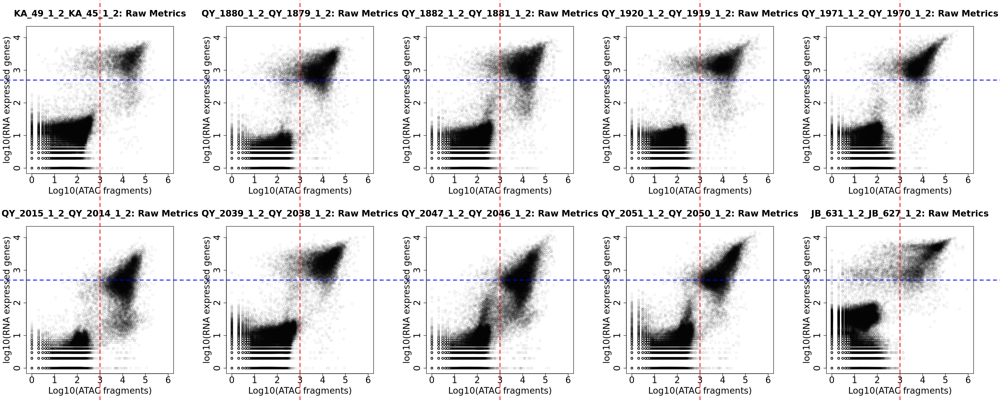

[1] "Checking sample:  QY_1886_1_2_QY_1885_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1914_1_2_QY_1913_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1916_1_2_QY_1915_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1969_1_2_QY_1968_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2019_1_2_QY_2018_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2045_1_2_QY_2044_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2049_1_2_QY_2048_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  KA_48_1_2_KA_44_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1922_1_2_QY_1921_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1924_1_2_QY_1923_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



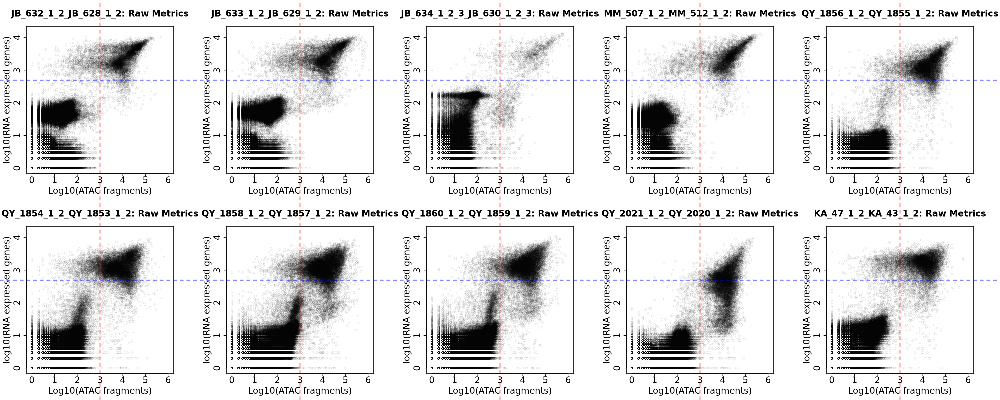

[1] "Checking sample:  QY_1967_1_2_QY_1966_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1973_1_2_QY_1972_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2017_1_2_QY_2016_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2041_1_2_QY_2040_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2043_1_2_QY_2042_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2053_1_2_QY_2052_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



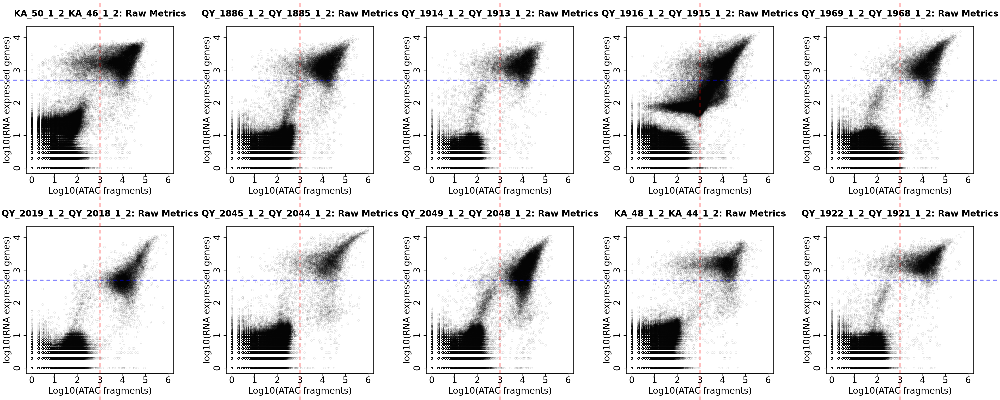

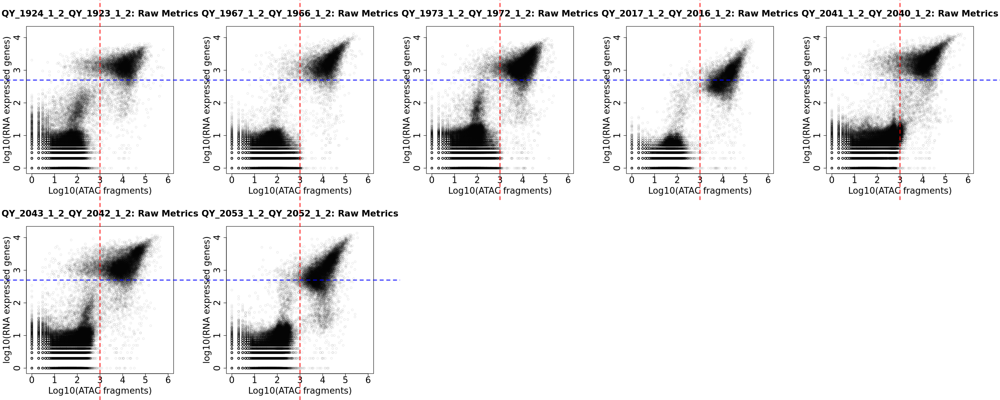

In [18]:
par(mfrow=c(2,5),xpd = T, mar = c(5,5,5,5))
options(repr.plot.width=25, repr.plot.height=10)

for (i in seq_along(sample.ls)){
gc(reset = TRUE)
    # Set sample variable
    sample = sample.ls[i]
    log_print(paste("Checking sample: ", sample))
    sample.dir <- paste(cell.ranger.dir, sprintf('%s/outs/', sample), sep = "")
    # Load data
    inputdata.10x <- Read10X_h5(file.path(sample.dir, 'raw_feature_bc_matrix.h5'))
    # Split RNA and ATAC
    rna_counts <- inputdata.10x$`Gene Expression`
    atac_counts <- inputdata.10x$`Peaks`
    # Create seurat Object
    adata <- CreateSeuratObject(counts=rna_counts)
    # add sample ID
    adata$samples = sample
    # add mithochondrial fraction
    adata[['percent.mt']] <- PercentageFeatureSet(adata, pattern = '^MT-')  
    qc <- read.table(file.path(sample.dir, 'per_barcode_metrics.csv'), sep=',', header=TRUE, stringsAsFactors=1)
    qc <- as.data.frame(qc)
    rownames(qc) <- qc$gex_barcode
    qc <- qc[Cells(adata), 1:length(colnames(qc))]
    adata <- AddMetaData(adata, qc)  
    # plot raw metrics
    metadata <- as.data.frame(as.matrix(adata@meta.data))
    metadata$atac_fragments = as.numeric(metadata$atac_fragments)
    metadata$nFeature_RNA = as.numeric(metadata$nFeature_RNA)
    log_data <- data.frame(genes=log10(metadata$nFeature_RNA),fragments=log10(metadata$atac_fragments))
    plot = plot(log_data$fragments, log_data$genes, pch=21, col = rgb(0, 0, 0, 0.1),
         cex=1, cex.main=2, cex.lab=2, cex.axis=2,
         xlim = c(0, log10(1000000)),
         ylim = c(0, log10(15000)),
         main=sprintf("%s: Raw Metrics",sample), xlab="Log10(ATAC fragments)", ylab="log10(RNA expressed genes)")
    abline(v = log10(1000), col="red", lwd=2, lty=2)
    #abline(v = log10(50000), col="red", lwd=2, lty=2)
    #abline(v = log10(75000), col="red", lwd=2, lty=2)
    #abline(v = log10(100000), col="red", lwd=2, lty=2)
    #abline(v = log10(125000), col="red", lwd=2, lty=2)
    #abline(v = log10(150000), col="red", lwd=2, lty=2)
    #abline(v = log10(200000), col="red", lwd=2, lty=2)
    abline(h = log10(500), col="blue", lwd=2, lty=2)
    #abline(h = log10(5000), col="blue", lwd=2, lty=2)
    #abline(h = log10(6000), col="blue", lwd=2, lty=2)
    #abline(h = log10(8000), col="blue", lwd=2, lty=2)
    #abline(h = log10(10000), col="blue", lwd=2, lty=2)
}

In [19]:
# RNA MT

[1] "Checking sample:  KA_49_1_2_KA_45_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1880_1_2_QY_1879_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1882_1_2_QY_1881_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1920_1_2_QY_1919_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1971_1_2_QY_1970_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2015_1_2_QY_2014_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2039_1_2_QY_2038_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2047_1_2_QY_2046_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2051_1_2_QY_2050_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  JB_631_1_2_JB_627_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  JB_632_1_2_JB_628_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  JB_633_1_2_JB_629_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  JB_634_1_2_3_JB_630_1_2_3"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  MM_507_1_2_MM_512_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1856_1_2_QY_1855_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1854_1_2_QY_1853_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1858_1_2_QY_1857_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1860_1_2_QY_1859_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2021_1_2_QY_2020_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  KA_47_1_2_KA_43_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  KA_50_1_2_KA_46_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



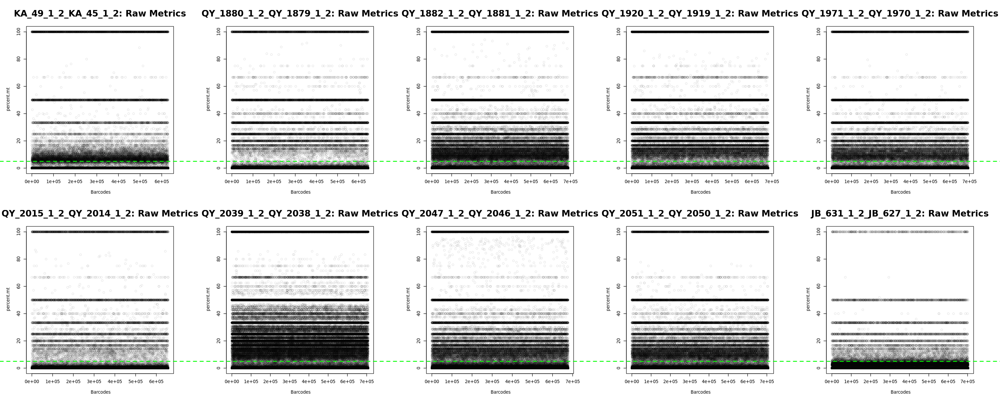

[1] "Checking sample:  QY_1886_1_2_QY_1885_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1914_1_2_QY_1913_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1916_1_2_QY_1915_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1969_1_2_QY_1968_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2019_1_2_QY_2018_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2045_1_2_QY_2044_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2049_1_2_QY_2048_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  KA_48_1_2_KA_44_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1922_1_2_QY_1921_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1924_1_2_QY_1923_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



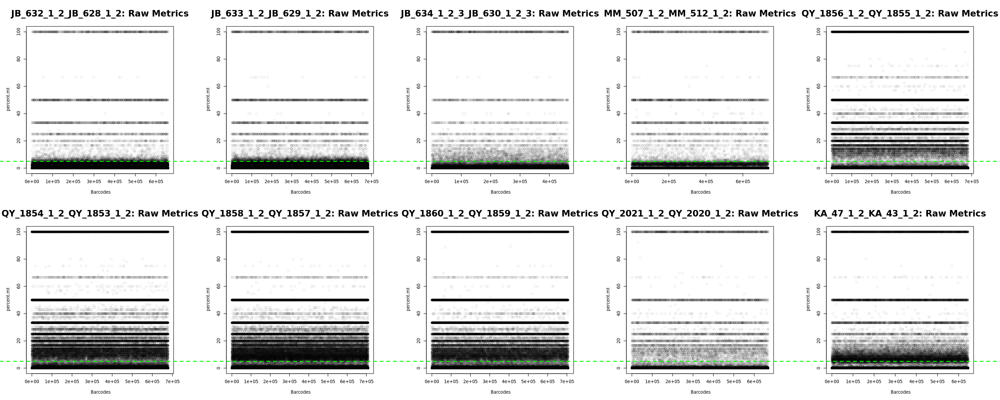

[1] "Checking sample:  QY_1967_1_2_QY_1966_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_1973_1_2_QY_1972_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2017_1_2_QY_2016_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2041_1_2_QY_2040_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2043_1_2_QY_2042_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



[1] "Checking sample:  QY_2053_1_2_QY_2052_1_2"


Genome matrix has multiple modalities, returning a list of matrices for this genome



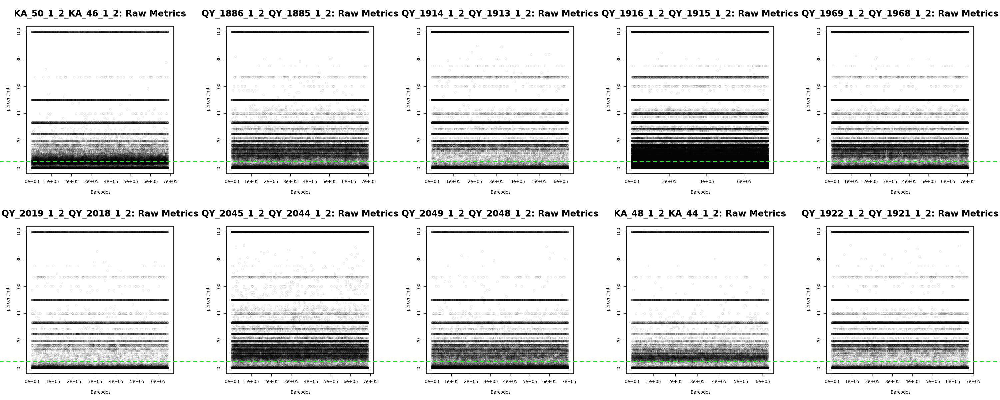

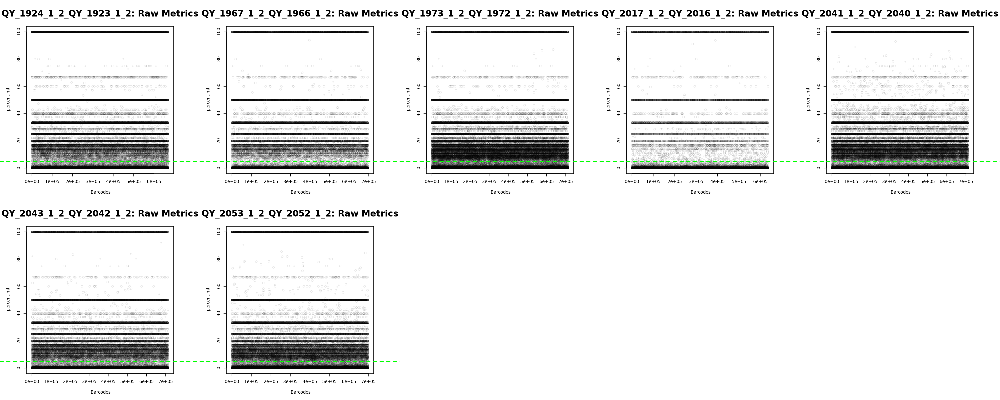

In [20]:
par(mfrow=c(2,5),xpd = T, mar = c(5,5,5,5))
options(repr.plot.width=25, repr.plot.height=10)

for (i in seq_along(sample.ls)){
 # Set sample variable
    gc(reset = TRUE)
    sample = sample.ls[i]
    log_print(paste("Checking sample: ", sample))
    sample.dir <- paste(cell.ranger.dir, sprintf('%s/outs/', sample), sep = "")
    # Load data
    inputdata.10x <- Read10X_h5(file.path(sample.dir, 'raw_feature_bc_matrix.h5'))
    # Split RNA and ATAC
    rna_counts <- inputdata.10x$`Gene Expression`
    atac_counts <- inputdata.10x$`Peaks`
    # Create seurat Object
    adata <- CreateSeuratObject(counts=rna_counts)
    # add sample ID
    adata$samples = sample
    # add mithochondrial fraction
    adata[['percent.mt']] <- PercentageFeatureSet(adata, pattern = '^MT-')
    plot = plot(adata$percent.mt,
     pch=21, col = rgb(0, 0, 0, 0.1),
     ylim = c(0, 100),
     ylab= "\n percent.mt",
     xlab= "\n Barcodes",
         cex=1, cex.main=2, cex.lab=1, cex.axis=1,
         main=sprintf("%s: Raw Metrics",sample))
    # abline(h = 2, col="green", lwd=2, lty=2)
    abline(h = 5, col="green", lwd=2, lty=2)
    #abline(h = 10, col="green", lwd=2, lty=2)
    #abline(h = 15, col="green", lwd=2, lty=2)
}

## Apply first filters

In [21]:
## Settings
nFeature_RNA.tresh.min = 500
atac_fragments.tresh.min = 1000
RNA.pctMT.tresh = 5

In [36]:
Multiome_processing <- function(i) {
    gc(reset = TRUE)
    # Set sample variable
    sample = sample.ls[i]
    log_print(paste("Processing sample: ", sample))
    sample.dir <- paste(cell.ranger.dir, sprintf('%s/outs/', sample), sep = "")
    # Load data
    inputdata.10x <- Read10X_h5(file.path(sample.dir, 'raw_feature_bc_matrix.h5'))
    # Split RNA and ATAC
    rna_counts <- inputdata.10x$`Gene Expression`
    atac_counts <- inputdata.10x$`Peaks`
    # Create seurat Object
    adata <- CreateSeuratObject(counts=rna_counts)
    # add sample ID
    adata$samples = sample
    # save total barcodes
        prefilter.barcodes = length(colnames(adata[["RNA"]]))
    # Filter by parameter: RNA nFeatures
    adata_sub <- subset(x = adata, subset = nFeature_RNA >= nFeature_RNA.tresh.min)
        RNA.min.filt.barcodes = length(colnames(adata_sub[["RNA"]]))
    # Add QC data from per_barcode_metrics.csv
    qc <- read.table(file.path(sample.dir, 'per_barcode_metrics.csv'), sep=',', header=TRUE, stringsAsFactors=1)
    qc <- as.data.frame(qc)
    rownames(qc) <- qc$gex_barcode
    qc <- qc[Cells(adata_sub), 1:length(colnames(qc))]
    adata_sub <- AddMetaData(adata_sub, qc)    
    # Filter by parameter: atac_fragments
    adata_sub <- subset(x = adata_sub, subset = atac_fragments >= atac_fragments.tresh.min)
        ATAC.min.filt.barcodes = length(colnames(adata_sub[["RNA"]]))
    # add mithochondrial fraction
    adata_sub[['percent.mt']] <- PercentageFeatureSet(adata_sub, pattern = '^MT-')
    adata_sub[["percent_chrM"]] = (adata_sub@meta.data$atac_mitochondrial_reads/adata_sub@meta.data$atac_raw_reads)*100
    # Filter by parameter: pctMT
    adata_sub <- subset(x = adata_sub, subset = percent.mt <= RNA.pctMT.tresh)
        percent.mt.filt.barcodes = length(colnames(adata_sub[["RNA"]]))
        #adata_sub <- subset(x = adata_sub, subset = percent_chrM <= ATAC.pctMT.tresh)
        #percent_chrM.filt.barcodes = length(colnames(adata_sub[["RNA"]]))
    # Filter by parameter: multiplet finder cellranger
    adata_sub <- subset(x = adata_sub, subset = excluded_reason != 1)
        mult.filt.barcodes = length(colnames(adata_sub[["RNA"]]))

    # Filter atac counts to have filtered cells
    atac_counts <- atac_counts[,colnames(adata_sub)]
    # Change peaks format
    grange.counts <- StringToGRanges(rownames(atac_counts), sep = c(':', '-'))
    grange.use <- seqnames(grange.counts) %in% standardChromosomes(grange.counts)
    atac_counts <- atac_counts[as.vector(grange.use), ]
    # Create chromatin assay
    frag.file <- file.path(sample.dir, 'atac_fragments.tsv.gz')
    suppressWarnings(chrom_assay <- CreateChromatinAssay(counts=atac_counts, sep=c(':', '-'), genome= seq.info, fragments=frag.file, min.cells=0, min.features=0, annotation=annotations))
    adata_sub[['ATAC']] <- chrom_assay
    # Grab stats for RNA
        RNA.feature.mean = mean(adata_sub$nFeature_RNA)
        RNA.feature.median = median(adata_sub$nFeature_RNA)
        percent.mt.median = median(adata_sub$percent.mt)
        percent.mt.mean = mean(adata_sub$percent.mt)
    # Grab stats for ATAC
        atac.fragment.mean = mean(adata_sub$atac_fragments)
        atac.fragment.median = median(adata_sub$atac_fragments)
    # Check TSSenrichment
    DefaultAssay(adata_sub) <- 'ATAC'
    suppressMessages(adata_sub <- TSSEnrichment(adata_sub))
        atac.TSSe.mean = mean(adata_sub$TSS.enrichment)
        atac.TSSe.median = median(adata_sub$TSS.enrichment)

        # Pile up QC
        qc.data$sample.ID = rbind(qc.data$sample.ID, sample)
        qc.data$prefilter.barcodes = rbind(qc.data$prefilter.barcodes, prefilter.barcodes)
        qc.data$RNA.min.filt.barcodes = rbind(qc.data$RNA.min.filt.barcodes, RNA.min.filt.barcodes) 
        qc.data$ATAC.min.filt.barcodes = rbind(qc.data$ATAC.min.filt.barcodes, ATAC.min.filt.barcodes)   
        qc.data$percent.mt.filt.barcodes = rbind(qc.data$percent.mt.filt.barcodes, percent.mt.filt.barcodes)
        #qc.data$percent_chrM.filt.barcodes = rbind(qc.data$percent_chrM.filt.barcodes, percent_chrM.filt.barcodes)
        qc.data$mult.filt.barcodes = rbind(qc.data$mult.filt.barcodes, mult.filt.barcodes)
        qc.data$RNA.feature.mean = rbind(qc.data$RNA.feature.mean, RNA.feature.mean)
        qc.data$RNA.feature.median = rbind(qc.data$RNA.feature.median, RNA.feature.median)
        qc.data$percent.mt.mean = rbind(qc.data$percent.mt.mean, percent.mt.mean)
        qc.data$percent.mt.median = rbind(qc.data$percent.mt.median, percent.mt.median)
        qc.data$atac.fragment.mean = rbind(qc.data$atac.fragment.mean, atac.fragment.mean)
        qc.data$atac.fragment.median = rbind(qc.data$atac.fragment.median, atac.fragment.median)
        qc.data$atac.TSSe.mean = rbind(qc.data$atac.TSSe.mean, atac.TSSe.mean)
        qc.data$atac.TSSe.median = rbind(qc.data$atac.TSSe.median, atac.TSSe.median)
    log_print("   - Analysing")
    # RNA analysis
    DefaultAssay(adata_sub) <- 'RNA'
    adata_sub <- SCTransform(adata_sub, verbose = FALSE) %>% RunPCA() %>% RunUMAP(dims=1:50, reduction.name='umap.rna', reduction.key='rnaUMAP_')
    # ATAC analysis
    # We exclude the first dimension as this is typically correlated with sequencing depth
    DefaultAssay(adata_sub) <- 'ATAC'
    adata_sub <- RunTFIDF(adata_sub)
    adata_sub <- FindTopFeatures(adata_sub, min.cutoff='q0')
    adata_sub <- RunSVD(adata_sub)
    adata_sub <- RunUMAP(adata_sub, reduction='lsi', dims=2:50, reduction.name='umap.atac', reduction.key='atacUMAP_')
    #multimodal analysis steps (See Seurat weighted nearest neighbors paper to learn more!)
    adata_sub <- FindMultiModalNeighbors(adata_sub, reduction.list=list('pca', 'lsi'), dims.list=list(1:50, 2:50))
    adata_sub <- RunUMAP(adata_sub, nn.name='weighted.nn', reduction.name='umap.wnn', reduction.key='wnnUMAP_')
    adata_sub <- FindClusters(adata_sub, graph.name='wsnn', algorithm=4, resolution = .5, verbose=FALSE)
    #add some log transformed metadata_sub
    adata_sub$log_nCount_ATAC = log(adata_sub$nCount_ATAC)
    adata_sub$log_nCount_SCT = log(adata_sub$nCount_SCT)
    adata_sub$log_nFeature_ATAC = log(adata_sub$nFeature_ATAC)
    adata_sub$log_nFeature_SCT = log(adata_sub$nFeature_SCT)

    log_print("   - Saving")
    ### Save intermediate RDS
    file = paste(step1.dir, sample, "_pre.filt.rds", sep = "")
    saveRDS(adata_sub, file = file)

    ## Save barcodes
    file = paste(step1.dir, sample, "_filtered.barcodes.txt", sep = "")
    filtered_bcs <- colnames(adata_sub[["RNA"]])
    write(filtered_bcs, file=file)
    return(qc.data)
    log_print("   - Done!")
}

In [37]:
cores <- 10
cl <- makeCluster(cores)
setDefaultCluster(cl)

qc.data = NULL
log_print(paste("Starting the analysis"))

# Process samples
qc.data.ls <- mclapply(1:length(sample.ls), function(i) Multiome_processing(i), mc.cores = cores)

[1] "Starting the analysis"


In [38]:
# Clean up the parallel backend
setDefaultCluster(NULL)
stopCluster(cl)

In [39]:
# Combine results into single dataframe
qc.data <- as.data.frame(do.call(rbind, qc.data.ls))
file = paste(step1.dir, "Cell.res.qc", sep = "")
fwrite(qc.data, file, sep='\t', row.names=FALSE, col.names=TRUE, quote=FALSE)

## Setup tresholds

In [41]:
## TSSenrichement

[1] "Checking sample:  KA_49_1_2_KA_45_1_2"
[1] "Checking sample:  QY_1920_1_2_QY_1919_1_2"
[1] "Checking sample:  QY_1971_1_2_QY_1970_1_2"
[1] "Checking sample:  QY_2015_1_2_QY_2014_1_2"
[1] "Checking sample:  QY_2039_1_2_QY_2038_1_2"
[1] "Checking sample:  QY_2047_1_2_QY_2046_1_2"
[1] "Checking sample:  QY_2051_1_2_QY_2050_1_2"
[1] "Checking sample:  JB_631_1_2_JB_627_1_2"
[1] "Checking sample:  JB_632_1_2_JB_628_1_2"
[1] "Checking sample:  JB_633_1_2_JB_629_1_2"
[1] "Checking sample:  JB_634_1_2_3_JB_630_1_2_3"
[1] "Checking sample:  MM_507_1_2_MM_512_1_2"
[1] "Checking sample:  QY_1856_1_2_QY_1855_1_2"
[1] "Checking sample:  QY_1854_1_2_QY_1853_1_2"
[1] "Checking sample:  QY_1858_1_2_QY_1857_1_2"
[1] "Checking sample:  QY_1860_1_2_QY_1859_1_2"
[1] "Checking sample:  QY_2021_1_2_QY_2020_1_2"
[1] "Checking sample:  KA_47_1_2_KA_43_1_2"


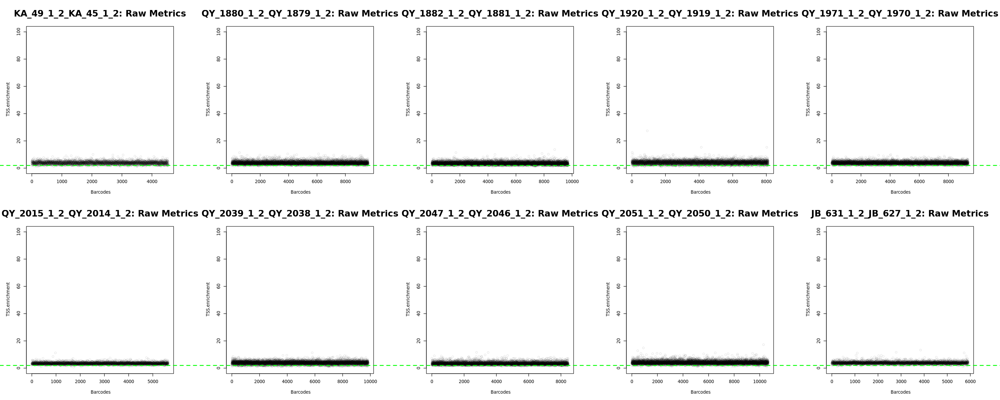

[1] "Checking sample:  KA_50_1_2_KA_46_1_2"
[1] "Checking sample:  QY_1886_1_2_QY_1885_1_2"
[1] "Checking sample:  QY_1914_1_2_QY_1913_1_2"
[1] "Checking sample:  QY_1916_1_2_QY_1915_1_2"
[1] "Checking sample:  QY_1969_1_2_QY_1968_1_2"
[1] "Checking sample:  QY_2019_1_2_QY_2018_1_2"
[1] "Checking sample:  QY_2045_1_2_QY_2044_1_2"
[1] "Checking sample:  QY_2049_1_2_QY_2048_1_2"
[1] "Checking sample:  KA_48_1_2_KA_44_1_2"
[1] "Checking sample:  QY_1922_1_2_QY_1921_1_2"


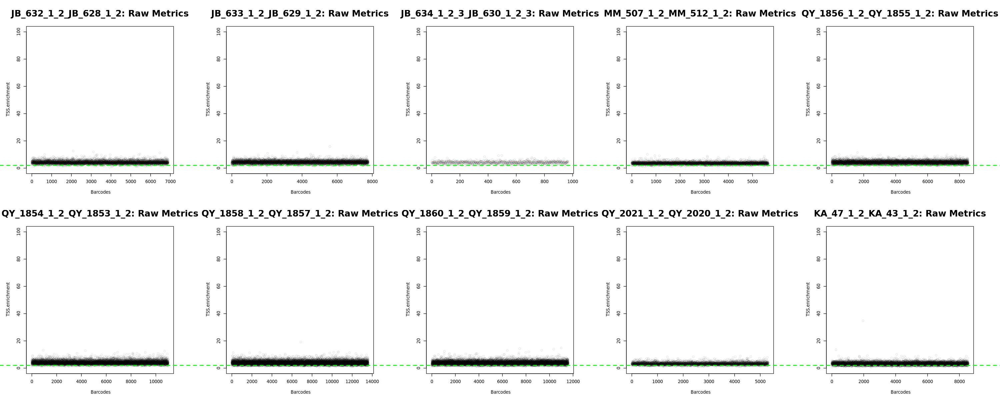

[1] "Checking sample:  QY_1924_1_2_QY_1923_1_2"
[1] "Checking sample:  QY_1967_1_2_QY_1966_1_2"
[1] "Checking sample:  QY_1973_1_2_QY_1972_1_2"
[1] "Checking sample:  QY_2017_1_2_QY_2016_1_2"
[1] "Checking sample:  QY_2041_1_2_QY_2040_1_2"
[1] "Checking sample:  QY_2043_1_2_QY_2042_1_2"
[1] "Checking sample:  QY_2053_1_2_QY_2052_1_2"


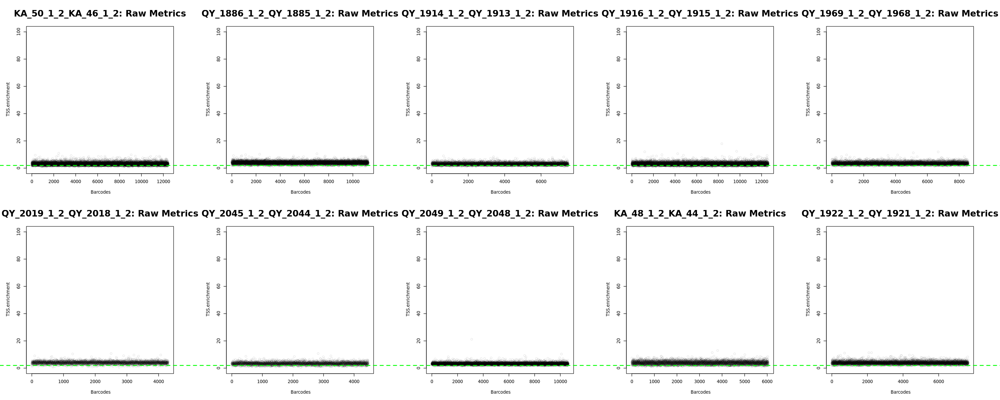

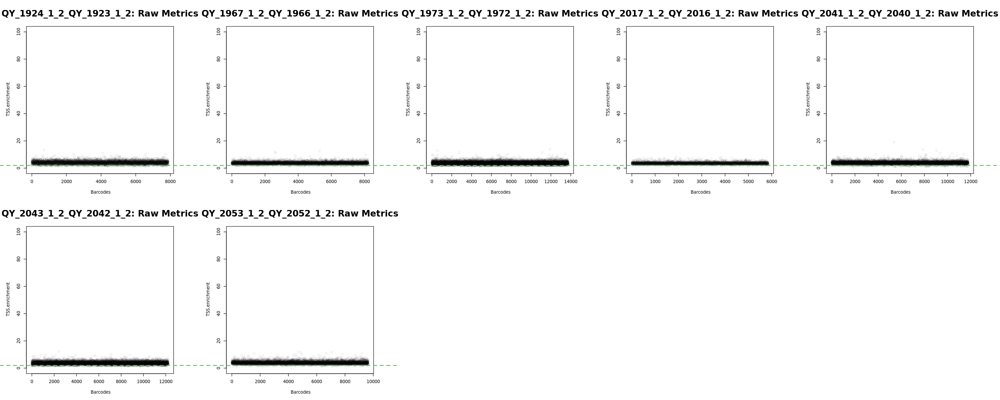

In [43]:
par(mfrow=c(2,5),xpd = T, mar = c(5,5,5,5))
options(repr.plot.width=25, repr.plot.height=10)

for (i in seq_along(sample.ls)){
 # Set sample variable
    gc(reset = TRUE)
    sample = sample.ls[i]
    log_print(paste("Checking sample: ", sample))
    sample.dir <- paste(cell.ranger.dir, sprintf('%s/outs/', sample), sep = "")
    # Load sample
    adata = readRDS(paste(step1.dir, sample, "_pre.filt.rds", sep = ""))
    # plot metrics
     plot = plot(adata$TSS.enrichment,
     pch=21, col = rgb(0, 0, 0, 0.1),
     ylim = c(0, 100),
     ylab= "\n TSS.enrichment",
     xlab= "\n Barcodes",
         cex=1, cex.main=2, cex.lab=1, cex.axis=1,
         main=sprintf("%s: Raw Metrics",sample))
    abline(h = 2, col="green", lwd=2, lty=2)
    #abline(h = 5, col="green", lwd=2, lty=2)
    #abline(h = 10, col="green", lwd=2, lty=2)
    #abline(h = 15, col="green", lwd=2, lty=2)
}

## Apply filters

In [44]:
TSSe.tresh = 2

In [45]:
Multiome_processing_2 <- function(i) {
    gc(reset = TRUE)
    # Set sample variable
    sample = sample.ls[i]
    log_print(paste("Filtering secondary parameters: ", sample))
    sample.dir <- paste(cell.ranger.dir, sprintf('%s/outs/', sample), sep = "")
    # Load sample
    adata = readRDS(paste(step1.dir, sample, "_pre.filt.rds", sep = ""))
    
    # Filter by parameter: TSSenrichment
    adata_sub <- subset(x = adata, subset = TSS.enrichment >= TSSe.tresh)
        TSSe.min.barcodes = length(colnames(adata_sub[["RNA"]]))
    # Grab stats for RNA
        RNA.feature.mean = mean(adata_sub$nFeature_RNA)
        RNA.feature.median = median(adata_sub$nFeature_RNA)
        percent.mt.median = median(adata_sub$percent.mt)
        percent.mt.mean = mean(adata_sub$percent.mt)
    # Grab stats for ATAC
        atac.fragment.mean = mean(adata_sub$atac_fragments)
        atac.fragment.median = median(adata_sub$atac_fragments)
        atac.TSSe.mean = mean(adata_sub$TSS.enrichment)
        atac.TSSe.median = median(adata_sub$TSS.enrichment)

        # Pile up QC
        qc.data$sample.ID = rbind(qc.data$sample.ID, sample)
        qc.data$TSSe.min.barcodes = rbind(qc.data$TSSe.min.barcodes, TSSe.min.barcodes) 
        qc.data$RNA.feature.mean = rbind(qc.data$RNA.feature.mean, RNA.feature.mean)
        qc.data$RNA.feature.median = rbind(qc.data$RNA.feature.median, RNA.feature.median)
        qc.data$percent.mt.mean = rbind(qc.data$percent.mt.mean, percent.mt.mean)
        qc.data$percent.mt.median = rbind(qc.data$percent.mt.median, percent.mt.median)
        qc.data$atac.fragment.mean = rbind(qc.data$atac.fragment.mean, atac.fragment.mean)
        qc.data$atac.fragment.median = rbind(qc.data$atac.fragment.median, atac.fragment.median)
        qc.data$atac.TSSe.mean = rbind(qc.data$atac.TSSe.mean, atac.TSSe.mean)
        qc.data$atac.TSSe.median = rbind(qc.data$atac.TSSe.median, atac.TSSe.median)
    log_print("   - Analysing")
    # RNA analysis
    DefaultAssay(adata_sub) <- 'RNA'
    adata_sub <- SCTransform(adata_sub, verbose = FALSE) %>% RunPCA() %>% RunUMAP(dims=1:50, reduction.name='umap.rna', reduction.key='rnaUMAP_')
    # ATAC analysis
    # We exclude the first dimension as this is typically correlated with sequencing depth
    DefaultAssay(adata_sub) <- 'ATAC'
    adata_sub <- RunTFIDF(adata_sub)
    adata_sub <- FindTopFeatures(adata_sub, min.cutoff='q0')
    adata_sub <- RunSVD(adata_sub)
    adata_sub <- RunUMAP(adata_sub, reduction='lsi', dims=2:50, reduction.name='umap.atac', reduction.key='atacUMAP_')
    #multimodal analysis steps (See Seurat weighted nearest neighbors paper to learn more!)
    adata_sub <- FindMultiModalNeighbors(adata_sub, reduction.list=list('pca', 'lsi'), dims.list=list(1:50, 2:50))
    adata_sub <- RunUMAP(adata_sub, nn.name='weighted.nn', reduction.name='umap.wnn', reduction.key='wnnUMAP_')
    adata_sub <- FindClusters(adata_sub, graph.name='wsnn', algorithm=4, resolution = .5, verbose=FALSE)
    #add some log transformed metadata_sub
    adata_sub$log_nCount_ATAC = log(adata_sub$nCount_ATAC)
    adata_sub$log_nCount_SCT = log(adata_sub$nCount_SCT)
    adata_sub$log_nFeature_ATAC = log(adata_sub$nFeature_ATAC)
    adata_sub$log_nFeature_SCT = log(adata_sub$nFeature_SCT)

    log_print("   - Saving")
    ### Save intermediate RDS
    file = paste(step1.dir, sample, "_pre.filt.rds", sep = "")
    saveRDS(adata_sub, file = file)

    ## Save barcodes
    file = paste(step1.dir, sample, "_filtered.barcodes.txt", sep = "")
    filtered_bcs <- colnames(adata_sub[["RNA"]])
    write(filtered_bcs, file=file)
    return(qc.data)
    log_print("   - Done!")
}

In [46]:
cores <- 20
cl <- makeCluster(cores)
setDefaultCluster(cl)

qc.data = NULL
log_print(paste("Starting the analysis"))

# Process samples
qc.data.ls <- mclapply(1:length(sample.ls), function(i) Multiome_processing_2(i), mc.cores = cores)

[1] "Starting the analysis"


In [47]:
# Clean up the parallel backend
setDefaultCluster(NULL)
stopCluster(cl)

In [48]:
# Combine results into single dataframe
qc.data <- as.data.frame(do.call(rbind, qc.data.ls))
file = paste(step1.dir, "2_Cell.res.qc", sep = "")
fwrite(qc.data, file, sep='\t', row.names=FALSE, col.names=TRUE, quote=FALSE)

# QC plots

In [12]:
qc.data_1 = read.table(paste(step1.dir, "Cell.res.qc", sep = ""), sep = "\t", header = TRUE)
qc.data_2 = read.table(paste(step1.dir, "2_Cell.res.qc", sep = ""), sep = "\t", header = TRUE)
qc.data = merge(qc.data_1, qc.data_2, by = "sample.ID")
head(qc.data)
colnames(qc.data)

,sample.ID,prefilter.barcodes,RNA.min.filt.barcodes,ATAC.min.filt.barcodes,percent.mt.filt.barcodes,mult.filt.barcodes,RNA.feature.mean.x,RNA.feature.median.x,percent.mt.mean.x,percent.mt.median.x,⋯,atac.TSSe.median.x,TSSe.min.barcodes,RNA.feature.mean.y,RNA.feature.median.y,percent.mt.mean.y,percent.mt.median.y,atac.fragment.mean.y,atac.fragment.median.y,atac.TSSe.mean.y,atac.TSSe.median.y
,<chr>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,JB_631_1_2_JB_627_1_2,702853,7661,6103,6102,5906,3206.016,2928.5,0.07143349,0.03040339,⋯,3.849400,5871,3217.458,2948,0.06906818,0.03010990,23955.56,14329.0,3.945106,3.853203
2,JB_632_1_2_JB_628_1_2,658719,7987,6904,6904,6888,3156.244,2719.0,0.11257926,0.05788791,⋯,4.128350,6815,3177.962,2753,0.10668830,0.05691520,20875.72,12182.0,4.314856,4.138253
3,JB_633_1_2_JB_629_1_2,683203,8962,7877,7869,7763,3185.394,2578.0,0.11527408,0.05673222,⋯,4.378600,7703,3199.760,2594,0.11248135,0.05629574,29438.03,15627.0,4.477007,4.387042
4,JB_634_1_2_3_JB_630_1_2_3,463663,1160,1016,1015,968,3785.904,3181.0,0.15204424,0.08954750,⋯,4.143167,951,3820.940,3190,0.14503327,0.08858965,59874.95,30425.0,4.161502,4.163416
5,KA_47_1_2_KA_43_1_2,644952,9844,8612,8570,8544,1831.206,1708.5,0.23044128,0.08705115,⋯,3.364030,7922,1862.863,1742,0.23526194,0.08510638,16220.38,11971.5,3.547719,3.460087
6,KA_48_1_2_KA_44_1_2,624652,6817,6063,6047,6042,1832.747,1552.0,0.24076597,0.09248128,⋯,3.949942,5773,1868.338,1587,0.23911638,0.08837826,18992.00,14093.0,4.069428,4.015002


[1] "sample.ID"                "prefilter.barcodes"      
 [3] "RNA.min.filt.barcodes"    "ATAC.min.filt.barcodes"  
 [5] "percent.mt.filt.barcodes" "mult.filt.barcodes"      
 [7] "RNA.feature.mean.x"       "RNA.feature.median.x"    
 [9] "percent.mt.mean.x"        "percent.mt.median.x"     
[11] "atac.fragment.mean.x"     "atac.fragment.median.x"  
[13] "atac.TSSe.mean.x"         "atac.TSSe.median.x"      
[15] "TSSe.min.barcodes"        "RNA.feature.mean.y"      
[17] "RNA.feature.median.y"     "percent.mt.mean.y"       
[19] "percent.mt.median.y"      "atac.fragment.mean.y"    
[21] "atac.fragment.median.y"   "atac.TSSe.mean.y"        
[23] "atac.TSSe.median.y"

In [31]:
cell.numbers = qc.data[,c(1,2,3,4,5,6,15)]
# Plot number of barcodes pre and post-filters
mat <- cell.numbers %>% gather(Filter.step, barcodes.number, 2:ncol(cell.numbers))
mat$Filter.step = factor(mat$Filter.step, levels = rev(colnames(cell.numbers[2:ncol(cell.numbers)])))
mat$labels = as.numeric(mat$barcodes.number)
mat$labels[mat$labels > 20000] = ""

In [32]:
head(mat, n = 2)

,sample.ID,Filter.step,barcodes.number,labels
,<chr>,<fct>,<int>,<chr>
1,JB_631_1_2_JB_627_1_2,prefilter.barcodes,702853,
2,JB_632_1_2_JB_628_1_2,prefilter.barcodes,658719,


In [33]:
mat$chamber <- sample.info$Chamber[match(mat$sample.ID, sample.info$ID)]

In [44]:
gg1 = ggplot(dplyr::filter(mat, chamber == "LA"), aes(x= sample.ID, y = barcodes.number, fill = Filter.step, label = labels)) + 
            theme_bw () +
            labs(y= "\n # of barcodes", x = "", title = " LA") +
            geom_bar(stat="identity", 
                     position = position_dodge(width = width), width = width,
                     colour="black") +
            scale_y_break(c(20000, 350000),scales = 0.3) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()+
            geom_text(hjust = -0.3, size = 2.9, position = position_dodge(width = width))

gg2 = ggplot(dplyr::filter(mat, chamber == "LV"), aes(x= sample.ID, y = barcodes.number, fill = Filter.step, label = labels)) + 
            theme_bw () +
            labs(y= "\n # of barcodes", x = "", title = " LV") +
            geom_bar(stat="identity", 
                     position = position_dodge(width = width), width = width,
                     colour="black") +
            scale_y_break(c(20000, 350000),scales = 0.3) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()+
            geom_text(hjust = -0.3, size = 2.9, position = position_dodge(width = width))

gg3 = ggplot(dplyr::filter(mat, chamber == "RA"), aes(x= sample.ID, y = barcodes.number, fill = Filter.step, label = labels)) + 
            theme_bw () +
            labs(y= "\n # of barcodes", x = "", title = " RA") +
            geom_bar(stat="identity", 
                     position = position_dodge(width = width), width = width,
                     colour="black") +
            scale_y_break(c(20000, 350000),scales = 0.3) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()+
            geom_text(hjust = -0.3, size = 2.9, position = position_dodge(width = width))

gg4 = ggplot(dplyr::filter(mat, chamber == "RV"), aes(x= sample.ID, y = barcodes.number, fill = Filter.step, label = labels)) + 
            theme_bw () +
            labs(y= "\n # of barcodes", x = "", title = " RV") +
            geom_bar(stat="identity", 
                     position = position_dodge(width = width), width = width,
                     colour="black") +
            scale_y_break(c(20000, 350000),scales = 0.3) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()+
            geom_text(hjust = -0.3, size = 2.9, position = position_dodge(width = width))

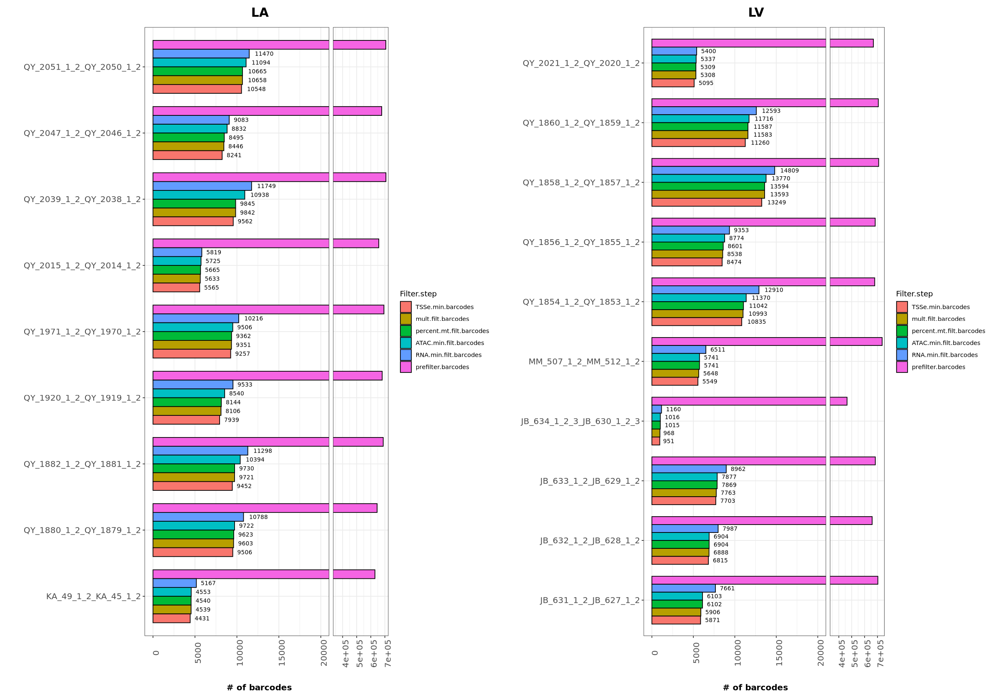

In [51]:
options(repr.plot.width = 20, repr.plot.height=14)
width = 0.8

gg1 + gg2

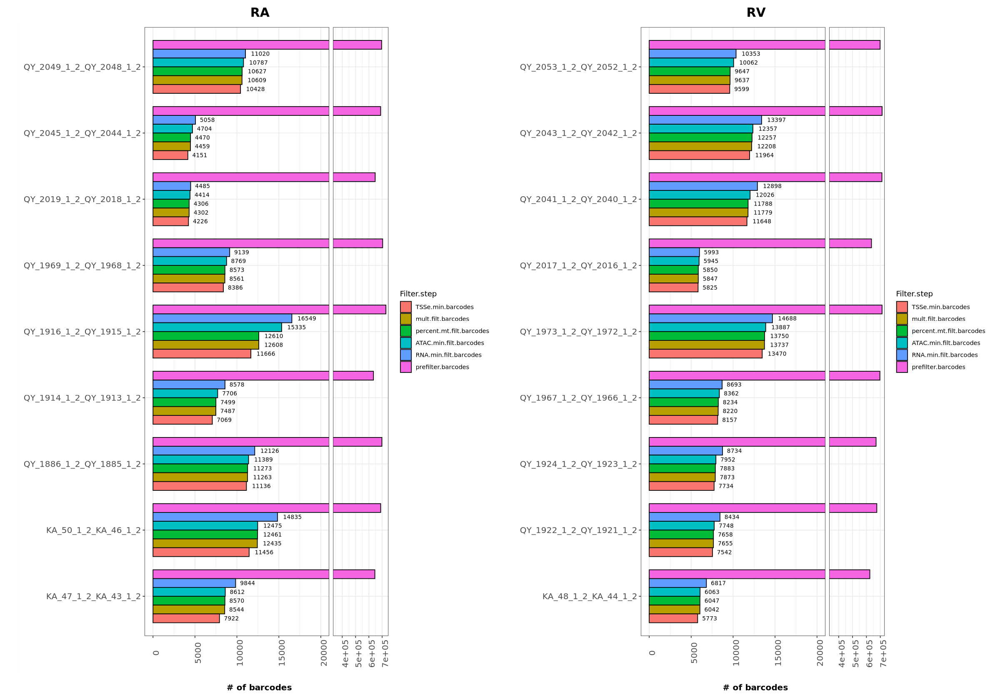

In [52]:
options(repr.plot.width = 20, repr.plot.height=14)
width = 0.8

gg3 + gg4

In [57]:
mat

sample.ID,prefilter.barcodes,RNA.min.filt.barcodes,ATAC.min.filt.barcodes,percent.mt.filt.barcodes,mult.filt.barcodes,RNA.feature.mean.x,RNA.feature.median.x,percent.mt.mean.x,percent.mt.median.x,⋯,atac.TSSe.mean.x,atac.TSSe.median.x,TSSe.min.barcodes,RNA.feature.mean.y,percent.mt.median.y,atac.fragment.mean.y,atac.TSSe.median.y,Stat,median,chamber
<chr>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<chr>
JB_631_1_2_JB_627_1_2,702853,7661,6103,6102,5906,3206.016,2928.5,0.07143349,0.03040339,⋯,3.932027,3.849400,5871,3217.458,0.03010990,23955.56,3.853203,RNA.feature.median.y,2948.0,LV
JB_632_1_2_JB_628_1_2,658719,7987,6904,6904,6888,3156.244,2719.0,0.11257926,0.05788791,⋯,4.287267,4.128350,6815,3177.962,0.05691520,20875.72,4.138253,RNA.feature.median.y,2753.0,LV
JB_633_1_2_JB_629_1_2,683203,8962,7877,7869,7763,3185.394,2578.0,0.11527408,0.05673222,⋯,4.456314,4.378600,7703,3199.760,0.05629574,29438.03,4.387042,RNA.feature.median.y,2594.0,LV
JB_634_1_2_3_JB_630_1_2_3,463663,1160,1016,1015,968,3785.904,3181.0,0.15204424,0.08954750,⋯,4.120017,4.143167,951,3820.940,0.08858965,59874.95,4.163416,RNA.feature.median.y,3190.0,LV
KA_47_1_2_KA_43_1_2,644952,9844,8612,8570,8544,1831.206,1708.5,0.23044128,0.08705115,⋯,3.413662,3.364030,7922,1862.863,0.08510638,16220.38,3.460087,RNA.feature.median.y,1742.0,RA
KA_48_1_2_KA_44_1_2,624652,6817,6063,6047,6042,1832.747,1552.0,0.24076597,0.09248128,⋯,3.965750,3.949942,5773,1868.338,0.08837826,18992.00,4.015002,RNA.feature.median.y,1587.0,RV
KA_49_1_2_KA_45_1_2,629446,5167,4553,4540,4539,2265.991,2007.0,0.21584426,0.07010984,⋯,3.945149,3.908527,4431,2274.706,0.06958942,23348.33,3.934161,RNA.feature.median.y,2021.0,LA
KA_50_1_2_KA_46_1_2,688853,14835,12475,12461,12435,2266.192,1850.0,0.17279310,0.09009009,⋯,3.274526,3.193989,11456,2352.164,0.08397313,13322.96,3.289662,RNA.feature.median.y,1924.0,RA
MM_507_1_2_MM_512_1_2,736320,6511,5741,5741,5648,2962.640,2404.5,0.05151940,0.02662428,⋯,3.661047,3.652059,5549,2996.873,0.02625361,28193.14,3.666911,RNA.feature.median.y,2431.0,LV


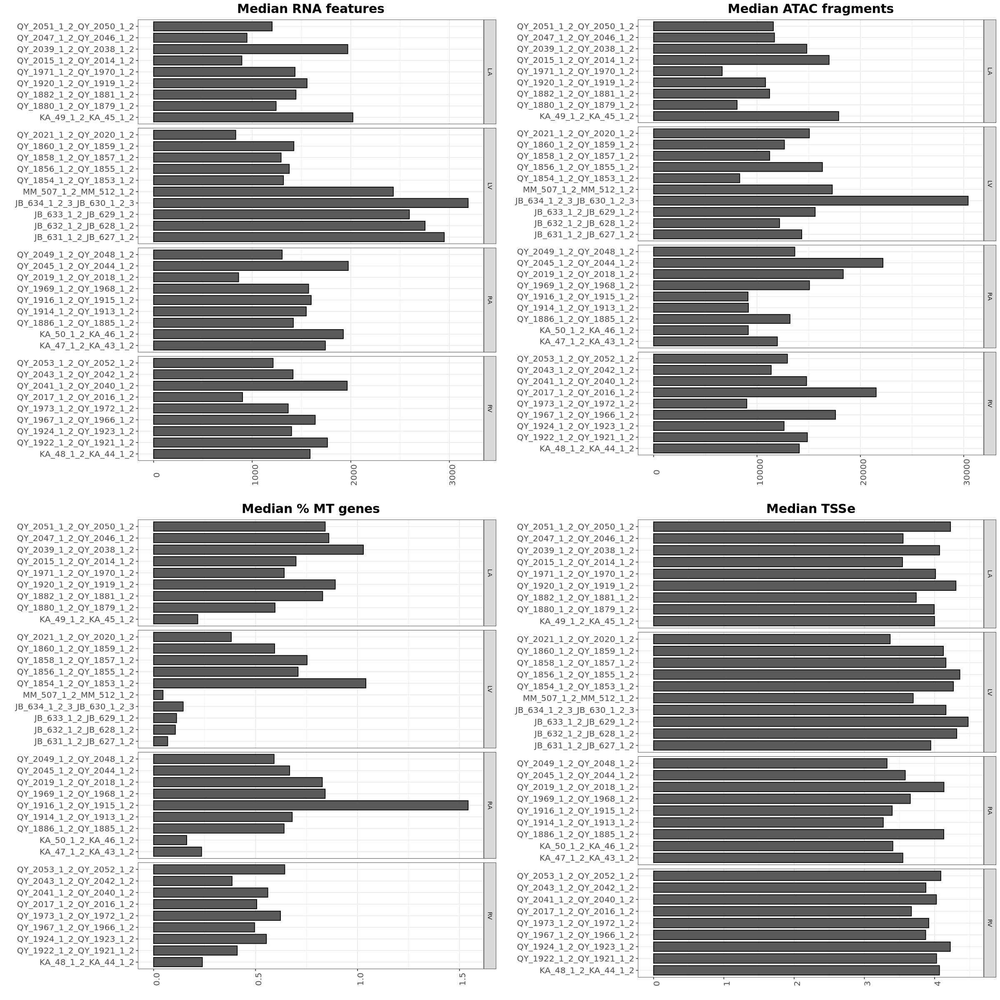

In [59]:
# Plot median features
options(repr.plot.width=10, repr.plot.height=7)
qc.data$chamber <- sample.info$Chamber[match(qc.data$sample.ID, sample.info$ID)]

width = 0.8
gg1 = ggplot(qc.data, aes(x= sample.ID, y = RNA.feature.median.y)) + 
            theme_bw () +
            labs(y= "", x = "", title = "Median RNA features") +
            geom_bar(stat="identity", 
                     position = position_dodge(width = width), width = width,
                     colour="black") +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()+
      facet_nested(rows = vars(chamber), scales = "free", space = "free")


gg2 = ggplot(qc.data, aes(x= sample.ID, y = atac.fragment.median.y)) + 
            theme_bw () +
            labs(y= "", x = "", title = "Median ATAC fragments") +
            geom_bar(stat="identity", 
                     position = position_dodge(width = width), width = width,
                     colour="black") +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()+
      facet_nested(rows = vars(chamber), scales = "free", space = "free")

gg3 = ggplot(qc.data, aes(x= sample.ID, y = percent.mt.mean.y)) + 
            theme_bw () +
            labs(y= "", x = "", title = "Median % MT genes") +
            geom_bar(stat="identity", 
                     position = position_dodge(width = width), width = width,
                     colour="black") +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()+
      facet_nested(rows = vars(chamber), scales = "free", space = "free")

gg4 = ggplot(qc.data, aes(x= sample.ID, y = atac.TSSe.mean.y)) + 
            theme_bw () +
            labs(y= "", x = "", title = "Median TSSe") +
            geom_bar(stat="identity", 
                     position = position_dodge(width = width), width = width,
                     colour="black") +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()+
      facet_nested(rows = vars(chamber), scales = "free", space = "free")


options(repr.plot.width=20, repr.plot.height=20)
grid.arrange(gg1, gg2, gg3, gg4, ncol=2, nrow = 2)

# Seurat Plots

In [53]:
for (i in seq_along(sample.ls)){
    gc(reset = TRUE)
    # Set sample variable
    sample = sample.ls[i]
    log_print(paste("Generating plots for sample: ", sample))
    sample.dir <- paste(cell.ranger.dir, sprintf('%s/outs/', sample), sep = "")
    # Load sample
    adata = readRDS(paste(step1.dir, sample, "_pre.filt.rds", sep = ""))
    
    # Generate UMAPS
    file = paste(step1.dir, sample,"_UMAPs.png", sep = "")
    png(file, width = 1728, height = 576)
    p1 <- DimPlot(adata, reduction='umap.rna', group.by='seurat_clusters', label=TRUE, label.size=8, repel=TRUE) + ggtitle('RNA')
    p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only') + theme(legend.position = "none")
    p2 <- DimPlot(adata, reduction='umap.atac', group.by='seurat_clusters', label=TRUE, label.size=8, repel=TRUE) + ggtitle('ATAC')
    p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only') + theme(legend.position = "none")
    p3 <- DimPlot(adata, reduction='umap.wnn', group.by='seurat_clusters', label=TRUE, label.size=8, repel=TRUE) + ggtitle('WNN')
    p3 <- p3 + xlab('UMAP 1')+ ylab('UMAP 2') + ggtitle('Combined') + theme(legend.position = "none")
    print(grid.arrange(p1, p2, p3, nrow = 1, top = textGrob(paste(sample, "\n"),
                                                            gp = gpar(fontsize = 18, fontface = "bold"))))
    garbage <- dev.off()
    
    # Make Violin plots
    file = paste(step1.dir, sample,"_metrics.png", sep = "")
    png(file, width = 2304, height = 1536)
    p1 <- VlnPlot(adata, features='nCount_SCT', group.by='seurat_clusters', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nCount_SCT), linetype='dashed', lw=2) + 
      theme(plot.title = element_text(size = 25), axis.text = element_text(size=20))
    p2 <- VlnPlot(adata, features='nFeature_SCT', group.by='seurat_clusters', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nFeature_SCT), linetype='dashed', lw=2) + 
      theme(plot.title = element_text(size = 25), axis.text = element_text(size=20))
    p3 <- VlnPlot(adata, features='nCount_ATAC', group.by='seurat_clusters', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nCount_ATAC), linetype='dashed', lw=2) + 
      theme(plot.title = element_text(size = 25), axis.text = element_text(size=20))
    p4 <- VlnPlot(adata, features='nFeature_ATAC', group.by='seurat_clusters', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nFeature_ATAC), linetype='dashed', lw=2) + 
      theme(plot.title = element_text(size = 25), axis.text = element_text(size=20))
    p5 <- VlnPlot(adata, features='nCount_RNA', group.by='seurat_clusters', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nCount_SCT), linetype='dashed', lw=2) + 
      theme(plot.title = element_text(size = 25), axis.text = element_text(size=20))
    p6 <- VlnPlot(adata, features='nFeature_RNA', group.by='seurat_clusters', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nFeature_SCT), linetype='dashed', lw=2) + 
      theme(plot.title = element_text(size = 25), axis.text = element_text(size=20))
    figure <- ggarrange(p1, p3, p5, p2, p4, p6, ncol = 3, nrow = 2,
                        common.legend = TRUE,legend="none")
    print(figure)
    garbage <- dev.off()
    
    # Make Markers plots
    file = paste(step1.dir, sample,"_Markers plot.png", sep = "")
    png(file, width = 2304, height = 1152, res = 150)
    g = DotPlot(adata, assay='SCT', features=cell.markers$marker, cluster.idents=TRUE, col.min=0) +
        theme(axis.text.x=element_text(angle=45, hjust=1)) + xlab('') + ylab('')
    meta_summary = g$data
    colnames(meta_summary)[3] = "marker"
    meta_summary = merge(meta_summary, cell.markers, by = "marker")

    options(repr.plot.width=25, repr.plot.height=10)
    figure <- ggplot(meta_summary, aes(x = marker, y = id)) +
      geom_point(aes(size = pct.exp, fill = avg.exp.scaled, stroke=NA),
                 shape = 21) +
      scale_size("% detected", range = c(0, 6)) +
      scale_fill_gradient(low = "lightgray", high = "blue",
                           guide = guide_colorbar(nbin = 200,
                                                  ticks.colour = "black", frame.colour = "black"),
                           name = "Average\nexpression") +
      ylab("Cluster") + xlab("") +
      theme_bw() +
      theme(axis.text = element_text(size = 100),
            axis.text.x = element_text(size = 10, angle = 45, hjust = 1, color = "black"),
            strip.text.x = element_text(size = 10),
            axis.text.y = element_text(size = 12, color = "black"),
            axis.title = element_text(size = 14)) +
      facet_nested(cols = vars(Compartment, CellType), scales = "free", space = "free")
    print(figure)
    garbage <- dev.off()


    # make UMIs/BC plots
    file = paste(step1.dir, sample,"_UMIs_per_BCs.png", sep = "")
    png(file, width = 1152, height = 576)
    par(mfrow=c(1,2))
    bc_summary <- read.table(file.path(sample.dir, 'per_barcode_metrics.csv'), sep=',', header=TRUE, stringsAsFactors=1)
    bc_summary["new_gex_umis_count"] = bc_summary["gex_exonic_umis"] + bc_summary["gex_intronic_umis"]
    bc_summary <- bc_summary[order(bc_summary$new_gex_umis_count, decreasing=TRUE),]
    plot(bc_summary$new_gex_umis_count, log='xy', type='l', main="RNA UMIs",
         xlab="BC Rank", ylab="Number RNA UMIs", col='dark green', lwd=2)
    bc_summary <- bc_summary[order(bc_summary$atac_fragments, decreasing=TRUE),]
    plot(bc_summary$atac_fragments, log='xy', type='l', main="ATAC UMIs",
         xlab="BC Rank", ylab="Number ATAC UMIs", col='orange', lwd=2)
    garbage <- dev.off()
    invisible(gc())
    
    # Plot RNA and ATAC features post filters
    file = paste(step1.dir, sample,"_RNA.features.density.png", sep = "")
    png(file, width = 576, height = 576)
    options(repr.plot.width=8, repr.plot.height=8)
    data = as.numeric(adata@meta.data$nFeature_RNA)
    data[data > 10000] = 10000
    quants = quantile(data)
    figure = ggplot(data=adata@meta.data, mapping = aes(x=data)) +
                labs(title = paste(sample, "\n", "RNA Features \n\n", 
                              paste("q2:", quants[2], '|',
                                    "q3:", quants[3], '|',
                                    "q4:", quants[4], '|'),sep = "")) +
                geom_density(alpha = 0.2, fill= 'lightpink', color="pink") + 
                theme_linedraw() + labs(x="nFeature_RNA") +
                geom_vline(xintercept=c(quants[2],quants[3],quants[4]), 
                           colour=c("blue", "red", "black"),linetype = "longdash") +
                scale_x_continuous(breaks=c(0,2000, 4000, 6000, 8000 ,10000),
                                   labels=c("0", "2k", "4k", "6k", "8k", ">=10k"))+
                theme(title=element_blank(),
                axis.text.x=element_text(size=20, vjust=0.5, angle = 90),
                axis.text.y=element_text(size=20, vjust=0.5),
                axis.title.x = element_text(size=25, vjust=-0.35),
                axis.title.y = element_text(size=25, vjust=0.5),
                plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))
    print(figure)
    garbage <- dev.off()
    
    file = paste(step1.dir, sample,"_ATAC.fragments.density.png", sep = "")
    png(file, width = 576, height = 576)
    options(repr.plot.width=8, repr.plot.height=8)
    data = as.numeric(adata@meta.data$atac_fragments)
    data[data > 60000] = 60000
    quants = quantile(data)
    figure = ggplot(data=adata@meta.data, mapping = aes(x=data)) +
                labs(title = paste(sample, "\n", "ATAC Fragments \n\n", 
                              paste("q2:", quants[2], '|',
                                    "q3:", quants[3], '|',
                                    "q4:", quants[4], '|'),sep = "")) +
                geom_density(alpha = 0.2, fill= 'lightpink', color="pink") + 
                theme_linedraw() + labs(x="atac_fragments") +
                geom_vline(xintercept=c(quants[2],quants[3],quants[4]), 
                           colour=c("blue", "red", "black"),linetype = "longdash") +
                scale_x_continuous(breaks=c(0, 20000, 40000, 60000),
                                   labels=c("0", "20k", "40k", ">=60k"))+
                theme(title=element_blank(),
                    axis.text.x=element_text(size=20, vjust=0.5, angle = 90),
                    axis.text.y=element_text(size=20, vjust=0.5),
                    axis.title.x = element_text(size=25, vjust=-0.35),
                    axis.title.y = element_text(size=25, vjust=0.5),
                    plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))
    print(figure)
    garbage <- dev.off()
}

[1] "Generating plots for sample:  KA_49_1_2_KA_45_1_2"
TableGrob (2 x 3) "arrange": 4 grobs
  z     cells    name                grob
1 1 (2-2,1-1) arrange      gtable[layout]
2 2 (2-2,2-2) arrange      gtable[layout]
3 3 (2-2,3-3) arrange      gtable[layout]
4 4 (1-1,1-3) arrange text[GRID.text.482]
[1] "Generating plots for sample:  QY_1880_1_2_QY_1879_1_2"
TableGrob (2 x 3) "arrange": 4 grobs
  z     cells    name                 grob
1 1 (2-2,1-1) arrange       gtable[layout]
2 2 (2-2,2-2) arrange       gtable[layout]
3 3 (2-2,3-3) arrange       gtable[layout]
4 4 (1-1,1-3) arrange text[GRID.text.4947]
[1] "Generating plots for sample:  QY_1882_1_2_QY_1881_1_2"
TableGrob (2 x 3) "arrange": 4 grobs
  z     cells    name                 grob
1 1 (2-2,1-1) arrange       gtable[layout]
2 2 (2-2,2-2) arrange       gtable[layout]
3 3 (2-2,3-3) arrange       gtable[layout]
4 4 (1-1,1-3) arrange text[GRID.text.9084]
[1] "Generating plots for sample:  QY_1920_1_2_QY_1919_1_2"
TableGrob (2 

[1] "Generating plots for sample:  QY_2045_1_2_QY_2044_1_2"
TableGrob (2 x 3) "arrange": 4 grobs
  z     cells    name                   grob
1 1 (2-2,1-1) arrange         gtable[layout]
2 2 (2-2,2-2) arrange         gtable[layout]
3 3 (2-2,3-3) arrange         gtable[layout]
4 4 (1-1,1-3) arrange text[GRID.text.105667]
[1] "Generating plots for sample:  QY_2049_1_2_QY_2048_1_2"
TableGrob (2 x 3) "arrange": 4 grobs
  z     cells    name                   grob
1 1 (2-2,1-1) arrange         gtable[layout]
2 2 (2-2,2-2) arrange         gtable[layout]
3 3 (2-2,3-3) arrange         gtable[layout]
4 4 (1-1,1-3) arrange text[GRID.text.109808]
[1] "Generating plots for sample:  KA_48_1_2_KA_44_1_2"
TableGrob (2 x 3) "arrange": 4 grobs
  z     cells    name                   grob
1 1 (2-2,1-1) arrange         gtable[layout]
2 2 (2-2,2-2) arrange         gtable[layout]
3 3 (2-2,3-3) arrange         gtable[layout]
4 4 (1-1,1-3) arrange text[GRID.text.113404]
[1] "Generating plots for sample:  QY_